# Testing SPIAT v1.0.0 in R-4.2.2

I-Hsuan Lin

University of Manchester

January 19, 2023


## Spatial Image Analysis of Tissues

Bioconductor URL: https://bioconductor.org/packages/SPIAT/

SPIAT (**Sp**atial **I**mage **A**nalysis of **T**issues) is an R package with a suite of data processing, quality control, visualization and data analysis tools. SPIAT is compatible with data generated from single-cell spatial proteomics platforms (e.g. OPAL, CODEX, MIBI, cellprofiler). SPIAT reads spatial data in the form of X and Y coordinates of cells, marker intensities and cell phenotypes. SPIAT includes six analysis modules that allow visualization, calculation of cell colocalization, categorization of the immune microenvironment relative to tumor areas, analysis of cellular neighborhoods, and the quantification of spatial heterogeneity, providing a comprehensive toolkit for spatial data analysis.

**Content**

0. <a href="#0.-Prepare-workspace">Prepare workspace</a>
1. <a href="#1.-Reading-in-data-and-data-formatting-in-SPIAT">Reading in data and data formatting in SPIAT</a>
2. <a href="#2.-Quality-control-and-visualisation-with-SPIAT">Quality control and visualisation with SPIAT</a>
3. <a href="#3.-Basic-analyses-with-SPIAT">Basic analyses with SPIAT</a>
4. <a href="#4.-Quantifying-cell-colocalisation-with-SPIAT">Quantifying cell colocalisation with SPIAT</a>
5. <a href="#5.-Spatial-heterogeneity-with-SPIAT">Spatial heterogeneity with SPIAT</a>
6. <a href="#6.-Characterising-tissue-structure-with-SPIAT">Characterising tissue structure with SPIAT</a>
7. <a href="#7.-Identifying-cellular-neighborhood-with-SPIAT">Identifying cellular neighborhood with SPIAT</a>

# 0. Prepare workspace

<div class="alert alert-info">
    <b>1. Set up conda environment</b>
    <br />
    <code>mamba create -n SPIAT -c conda-forge -c bioconda jupyterlab nb_conda_kernels r-base=4.2 r-irkernel r-devtools r-cowplot bioconductor-spiat</code>
    <br />
    <br />
    <b>2. Activate conda environment</b>
    <br />
    <code>conda activate SPIAT</code>
    <br />
    <br />
    <b>3. Install scRUtils package in SPIAT env to use the <code>fig</code> function</b>
    <br />
    <code>mamba install -c conda-forge bioconductor-bluster bioconductor-scater</code>
    <br />
    <code>(in R) devtools::install_github("ycl6/scRUtils")</code>
</div>

## Load packages and demo data

In [1]:
suppressPackageStartupMessages({
    library(SPIAT)
    library(scRUtils) # To use fig()
})

# Set output window width
options(width = 110) # default 80; getOption("width")

### `simulated_image`

A `SpatialExperiment` object of a formatted image (simulated by `spaSim` package). It has: 
- cell ids and phenotypes in `colData()`
- cell coordinates in `spatialCoords()`
- marker intensities in `assays()`

In [2]:
data("simulated_image")
simulated_image

class: SpatialExperiment 
dim: 5 4951 
metadata(0):
assays(1): ''
rownames(5): Tumour_marker Immune_marker1 Immune_marker2 Immune_marker3 Immune_marker4
rowData names(0):
colnames(4951): Cell_1 Cell_2 ... Cell_4950 Cell_4951
colData names(2): Phenotype sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

### `image_no_markers`

A `SpatialExperiment` object of a formatted image without marker intensities (simulated by `spaSim` package). It has:
- cell ids and cell types in `colData()`
- cell coordinates in `spatialCoords()`

In [3]:
data("image_no_markers")
image_no_markers

class: SpatialExperiment 
dim: 1 4951 
metadata(0):
assays(1): ''
rownames(1): pseudo
rowData names(0):
colnames(4951): Cell_1 Cell_2 ... Cell_4950 Cell_4951
colData names(3): Cell.Type Cell.Size sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

### `defined_image`

A `SpatialExperiment` object of a formatted image (simulated by `spaSim` package), with defined cell types based on marker combinations. It has: 

- cell ids, phenotypes, defined cell types in `colData()`
- cell coordinates in `spatialCoords()`
- marker intensities in `assays()`

In [4]:
data("defined_image")
defined_image

class: SpatialExperiment 
dim: 5 4951 
metadata(0):
assays(1): ''
rownames(5): Tumour_marker Immune_marker1 Immune_marker2 Immune_marker3 Immune_marker4
rowData names(0):
colnames(4951): Cell_1 Cell_2 ... Cell_4950 Cell_4951
colData names(3): Phenotype sample_id Cell.Type
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(1): sample_id

# 1. Reading in data and data formatting in SPIAT

## 1-1. Reading in data

### Reading in data through the ‘general’ option (RECOMMENDED)

In [5]:
# Construct a dummy marker intensity matrix
# rows are markers, columns are cells
intensity_matrix <- matrix(c(14.557, 0.169, 1.655, 0.054, 
                             17.588, 0.229, 1.188, 2.074, 
                             21.262, 4.206,  5.924, 0.021), nrow = 4, ncol = 3)
# define marker names as rownames
rownames(intensity_matrix) <- c("DAPI", "CD3", "CD4", "AMACR")
# define cell IDs as colnames
colnames(intensity_matrix) <- c("Cell_1", "Cell_2", "Cell_3") 

# Construct a dummy metadata (phenotypes, x/y coordinates)
# the order of the elements in these vectors correspond to the cell order 
# in `intensity matrix`
phenotypes <- c("OTHER", "AMACR", "CD3,CD4")
coord_x <- c(82, 171, 184)
coord_y <- c(30, 22, 38)

general_format_image <- format_image_to_spe(format = "general", intensity_matrix = intensity_matrix,
                                            phenotypes = phenotypes, coord_x = coord_x,coord_y = coord_y)

In [6]:
# phenotypes and cell properties (if available)
colData(general_format_image)

# cell coordinates
spatialCoords(general_format_image)

# marker intensities
assay(general_format_image)

DataFrame with 3 rows and 3 columns
           Cell.ID   Phenotype   sample_id
       <character> <character> <character>
Cell_1      Cell_1       OTHER    sample01
Cell_2      Cell_2       AMACR    sample01
Cell_3      Cell_3     CD3,CD4    sample01

Cell.X.Position,Cell.Y.Position
82,30
171,22
184,38


,Cell_1,Cell_2,Cell_3
DAPI,14.557,17.588,21.262
CD3,0.169,0.229,4.206
CD4,1.655,1.188,5.924
AMACR,0.054,2.074,0.021


### Reading in data from inForm

In [7]:
raw_inform_data <- system.file("extdata", "tiny_inform.txt.gz", package = "SPIAT")
markers <- c("DAPI", "CD3", "PD-L1", "CD4", "CD8", "AMACR")
locations <- c("Nucleus","Cytoplasm", "Membrane","Cytoplasm","Cytoplasm",
               "Cytoplasm") # The order is the same as `markers`.
formatted_image <- format_image_to_spe(format = "inForm", path = raw_inform_data, markers = markers, 
                                       locations = locations)
formatted_image

Rows: 9 Columns: 206
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (13): Path, Sample Name, Tissue Category, Phenotype, Process Region ID, Distance from Process Region ...
dbl (188): Cell ID, Cell X Position, Cell Y Position, Category Region ID, Nucleus Area (pixels), Nucleus C...
lgl   (5): Total Cells, Tissue Category Area (pixels), Cell Density (per megapixel), Lab ID, inForm 2.4.66...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


class: SpatialExperiment 
dim: 6 9 
metadata(0):
assays(1): ''
rownames(6): DAPI CD3 ... CD8 AMACR
rowData names(0):
colnames(9): Cell_1 Cell_2 ... Cell_8 Cell_9
colData names(7): Phenotype Cell.Area ... Cell.Axis.Ratio sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

In [8]:
raw_inform_data <- system.file("extdata", "tiny_inform.txt.gz", package = "SPIAT")
markers <- c("DAPI", "CD3", "PD-L1", "CD4", "CD8", "AMACR")
intensity_columns_interest <- c(
    "Nucleus DAPI (DAPI) Mean (Normalized Counts, Total Weighting)",
    "Cytoplasm CD3 (Opal 520) Mean (Normalized Counts, Total Weighting)", 
    "Membrane PD-L1 (Opal 540) Mean (Normalized Counts, Total Weighting)",
    "Cytoplasm CD4 (Opal 620) Mean (Normalized Counts, Total Weighting)",
    "Cytoplasm CD8 (Opal 650) Mean (Normalized Counts, Total Weighting)", 
    "Cytoplasm AMACR (Opal 690) Mean (Normalized Counts, Total Weighting)") # The order is the same as `markers`.
formatted_image <- format_inform_to_spe(path = raw_inform_data, markers = markers, 
                                        intensity_columns_interest = intensity_columns_interest)
formatted_image

Rows: 9 Columns: 206
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (13): Path, Sample Name, Tissue Category, Phenotype, Process Region ID, Distance from Process Region ...
dbl (188): Cell ID, Cell X Position, Cell Y Position, Category Region ID, Nucleus Area (pixels), Nucleus C...
lgl   (5): Total Cells, Tissue Category Area (pixels), Cell Density (per megapixel), Lab ID, inForm 2.4.66...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


class: SpatialExperiment 
dim: 6 9 
metadata(0):
assays(1): ''
rownames(6): DAPI CD3 ... CD8 AMACR
rowData names(0):
colnames(9): Cell_1 Cell_2 ... Cell_8 Cell_9
colData names(7): Phenotype Cell.Area ... Cell.Axis.Ratio sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

In [9]:
dim(colData(formatted_image))

dim(assay(formatted_image))

[1] 9 7

[1] 6 9

### Reading in data from HALO

In [10]:
raw_halo_data <- system.file("extdata", "tiny_halo.csv.gz", package = "SPIAT")
markers <- c("DAPI", "CD3", "PD-L1", "CD4", "CD8", "AMACR")
intensity_columns_interest <- c("Dye 1 Nucleus Intensity", "Dye 2 Cytoplasm Intensity",
                                "Dye 3 Membrane Intensity", "Dye 4 Cytoplasm Intensity",
                                "Dye 5 Cytoplasm Intensity", "Dye 6 Cytoplasm Intensity")
dye_columns_interest <- c("Dye 1 Positive Nucleus", "Dye 2 Positive Cytoplasm",
                          "Dye 3 Positive Membrane", "Dye 4 Positive Cytoplasm",
                          "Dye 5 Positive Cytoplasm", "Dye 6 Positive Cytoplasm")
formatted_image <- format_halo_to_spe(path = raw_halo_data, markers = markers, 
                                      intensity_columns_interest = intensity_columns_interest, 
                                      dye_columns_interest = dye_columns_interest)
formatted_image

Rows: 10 Columns: 71
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): Analysis Region, Analysis Inputs, Classifier Label
dbl (65): Object Id, XMin, XMax, YMin, YMax, Dye 1 Positive, Dye 1 Positive Nucleus, Dye 1 Nucleus Intensi...
lgl  (3): Image Location, Region Area (μm²), Region Perimeter (μm)

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


class: SpatialExperiment 
dim: 6 10 
metadata(0):
assays(1): ''
rownames(6): DAPI CD3 ... CD8 AMACR
rowData names(0):
colnames(10): Cell_723 Cell_724 ... Cell_731 Cell_732
colData names(5): Phenotype Nucleus.Area Cytoplasm.Area Cell.Area sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

In [11]:
dim(colData(formatted_image))

dim(assay(formatted_image))

[1] 10  5

[1]  6 10

## 1-2. Inspecting the SpaitalExperiment object

### Structure of a SPIAT SpatialExperiment object

In [12]:
simulated_image

class: SpatialExperiment 
dim: 5 4951 
metadata(0):
assays(1): ''
rownames(5): Tumour_marker Immune_marker1 Immune_marker2 Immune_marker3 Immune_marker4
rowData names(0):
colnames(4951): Cell_1 Cell_2 ... Cell_4950 Cell_4951
colData names(2): Phenotype sample_id
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : Cell.X.Position Cell.Y.Position
imgData names(0):

In [13]:
assay(simulated_image)[, 1:5]

,Cell_1,Cell_2,Cell_3,Cell_4,Cell_5
Tumour_marker,4.466925e-01,1.196802e-04,0.235435887,1.125552e-01,1.600443e-02
Immune_marker1,1.143640e-05,4.360881e-19,0.120582510,2.031554e-13,1.685832e-01
Immune_marker2,1.311175e-15,5.678623e-02,0.115769761,5.840184e-12,9.025254e-05
Immune_marker3,6.342341e-09,2.862823e-06,0.053107792,6.289501e-04,4.912962e-13
Immune_marker4,2.543406e-04,4.702311e-04,0.005878394,4.582812e-03,2.470984e-03


In [14]:
colData(simulated_image)[1:5, ]

DataFrame with 5 rows and 2 columns
         Phenotype   sample_id
       <character> <character>
Cell_1       OTHER    sample01
Cell_2       OTHER    sample01
Cell_3       OTHER    sample01
Cell_4       OTHER    sample01
Cell_5       OTHER    sample01

In [15]:
spatialCoords(simulated_image)[1:5, ]

,Cell.X.Position,Cell.Y.Position
Cell_1,139.77484,86.704079
Cell_2,77.86721,80.096527
Cell_3,84.44626,19.238638
Cell_4,110.19857,5.656004
Cell_5,167.89558,171.926407


In [16]:
cbind(sort(table(simulated_image$Phenotype)))

"Immune_marker1,Immune_marker3",178
"Immune_marker1,Immune_marker2",338
"Immune_marker1,Immune_marker2,Immune_marker4",630
Tumour_marker,819
OTHER,2986


### Splitting images

In [17]:
split_image <- image_splitter(simulated_image, number_of_splits = 3, plot = FALSE)

class(split_image)
names(split_image)

[1] "list"

[1] "simulated_imager1c1" "simulated_imager2c1" "simulated_imager3c1" "simulated_imager1c2"
[5] "simulated_imager2c2" "simulated_imager3c2" "simulated_imager1c3" "simulated_imager2c3"
[9] "simulated_imager3c3"

### Predicting cell phenotypes

[1] "Tumour_marker"
[1] "Immune_marker1"
[1] "Immune_marker2"
[1] "Immune_marker3"
[1] "Immune_marker4"


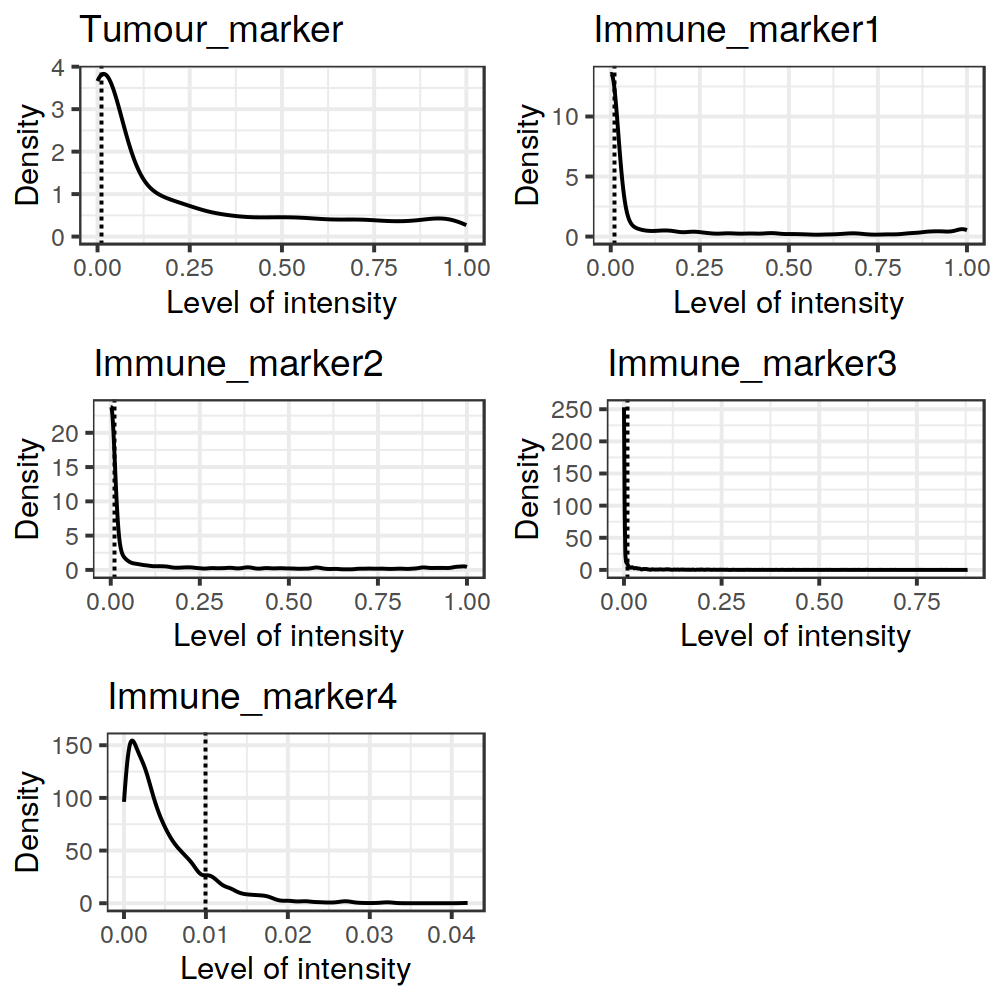

In [18]:
fig(width = 5, height = 5, res = 200)
predicted_image <- predict_phenotypes(spe_object = simulated_image, thresholds = NULL,
                                      tumour_marker = "Tumour_marker",
                                      baseline_markers = c("Immune_marker1", "Immune_marker2", 
                                                           "Immune_marker3", "Immune_marker4"),
                                      reference_phenotypes = TRUE)

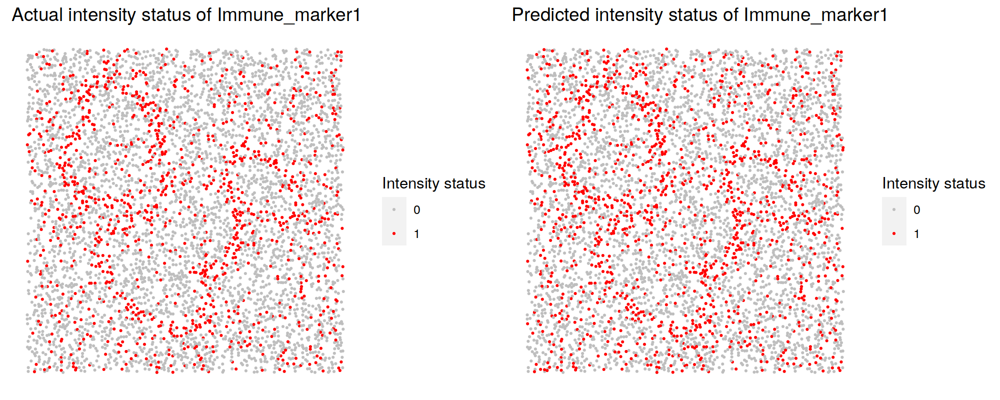

In [19]:
fig(width = 10, height = 4, res = 200)
marker_prediction_plot(predicted_image, marker = "Immune_marker1")

[1] "Tumour_marker  threshold intensity:  0.445450443784465"
[1] "Immune_marker1  threshold intensity:  0.116980867970434"
[1] "Immune_marker2  threshold intensity:  0.124283809517202"
[1] "Immune_marker3  threshold intensity:  0.0166413130263845"
[1] "Immune_marker4  threshold intensity:  0.00989731350898589"


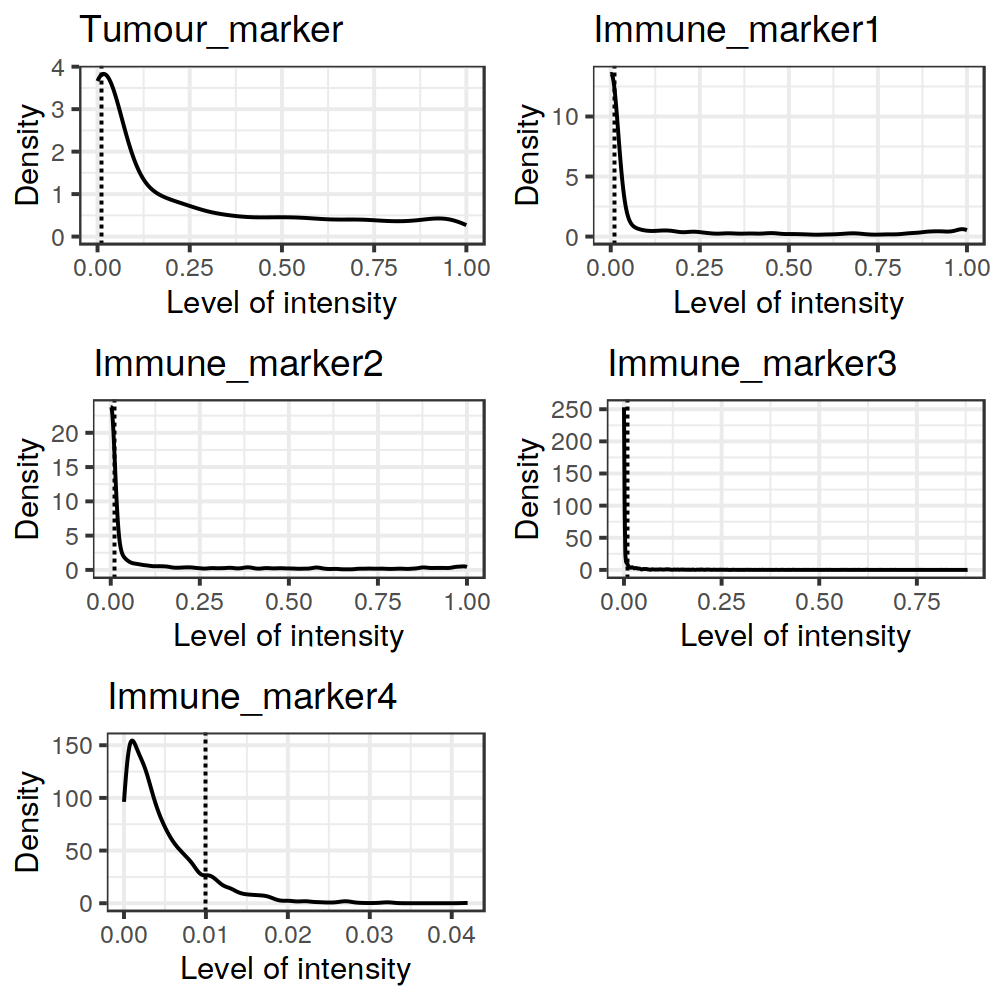

In [20]:
fig(width = 5, height = 5, res = 200)
predicted_image2 <- predict_phenotypes(spe_object = simulated_image, thresholds = NULL, 
                                       tumour_marker = "Tumour_marker", 
                                       baseline_markers = c("Immune_marker1", "Immune_marker2", 
                                                            "Immune_marker3", "Immune_marker4"), 
                                       reference_phenotypes = FALSE)

### Specifying cell types

In [21]:
formatted_image <- define_celltypes(
    simulated_image, 
    categories = c("Tumour_marker","Immune_marker1,Immune_marker2", "Immune_marker1,Immune_marker3", 
                   "Immune_marker1,Immune_marker2,Immune_marker4", "OTHER"), 
    category_colname = "Phenotype", 
    names = c("Tumour", "Immune1", "Immune2", "Immune3", "Others"),
    new_colname = "Cell.Type")

# 2. Quality control and visualisation with SPIAT

## 2-1. Visualise marker levels

### Boxplots of marker intensities

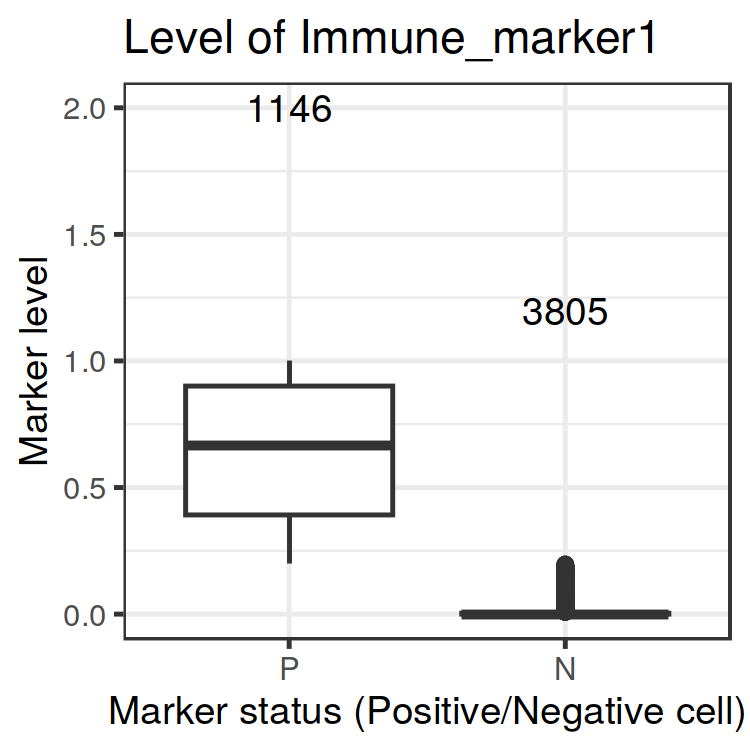

In [22]:
fig(width = 3, height = 3, res = 250)
marker_intensity_boxplot(formatted_image, "Immune_marker1")

### Scatter plots of marker levels

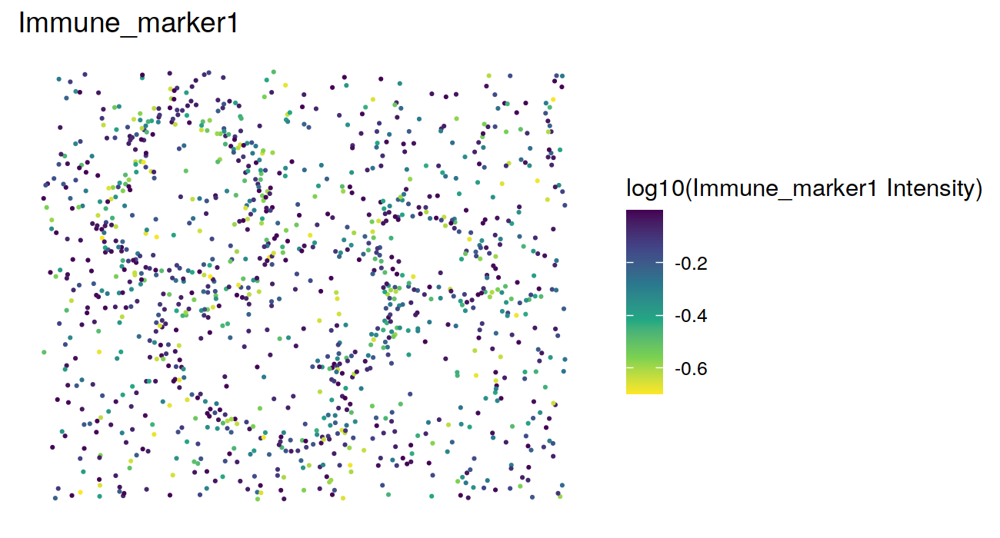

In [23]:
fig(width = 6.5, height = 3.5, res = 200)
plot_cell_marker_levels(formatted_image, "Immune_marker1")

### Heatmaps of marker levels

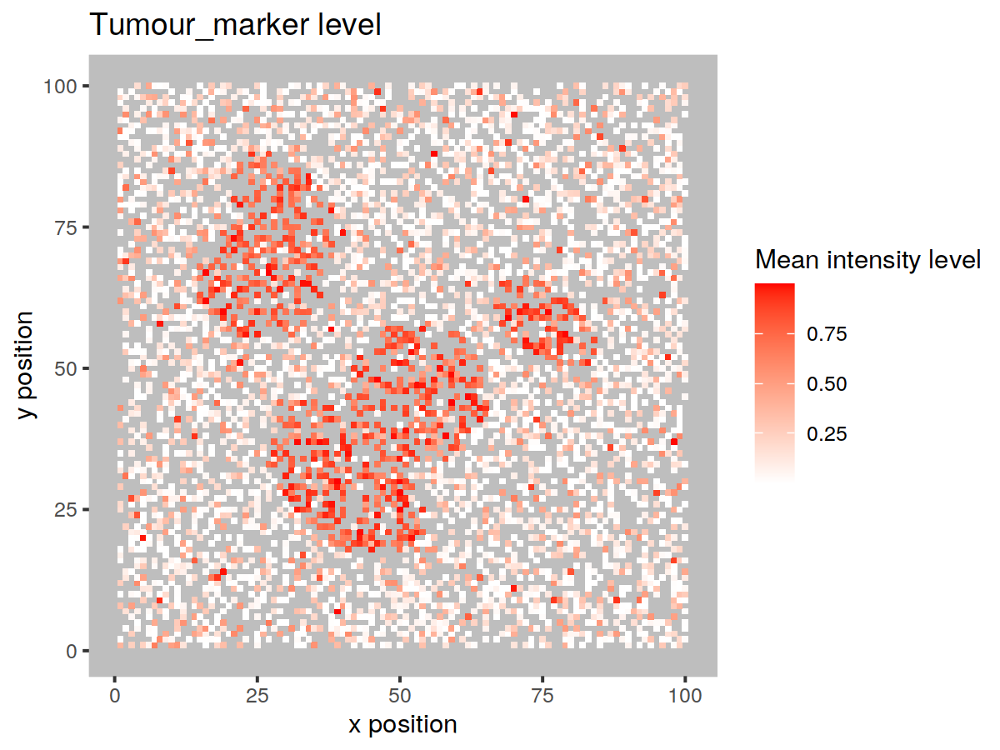

In [24]:
fig(width = 6, height = 4.5, res = 200)
plot_marker_level_heatmap(formatted_image, num_splits = 100, "Tumour_marker")

## 2-2. Identifying incorrect phenotypes

### Removing cells with incorrect phenotypes

In [25]:
data_subset <- select_celltypes(
    formatted_image, keep = TRUE, 
    celltypes = c("Tumour_marker","Immune_marker1,Immune_marker3", "Immune_marker1,Immune_marker2", 
                  "Immune_marker1,Immune_marker2,Immune_marker4"), 
    feature_colname = "Phenotype")

# have a look at what phenotypes are present
unique(data_subset$Phenotype)

[1] "Immune_marker1,Immune_marker2"                "Tumour_marker"                               
[3] "Immune_marker1,Immune_marker2,Immune_marker4" "Immune_marker1,Immune_marker3"

### Dimensionality reduction to identify misclassified cells

[1] "Tumour_marker  threshold intensity:  0.445450443784465"
[1] "Immune_marker1  threshold intensity:  0.116980867970434"
[1] "Immune_marker2  threshold intensity:  0.124283809517202"
[1] "Immune_marker3  threshold intensity:  0.0166413130263845"
[1] "Immune_marker4  threshold intensity:  0.00989731350898589"


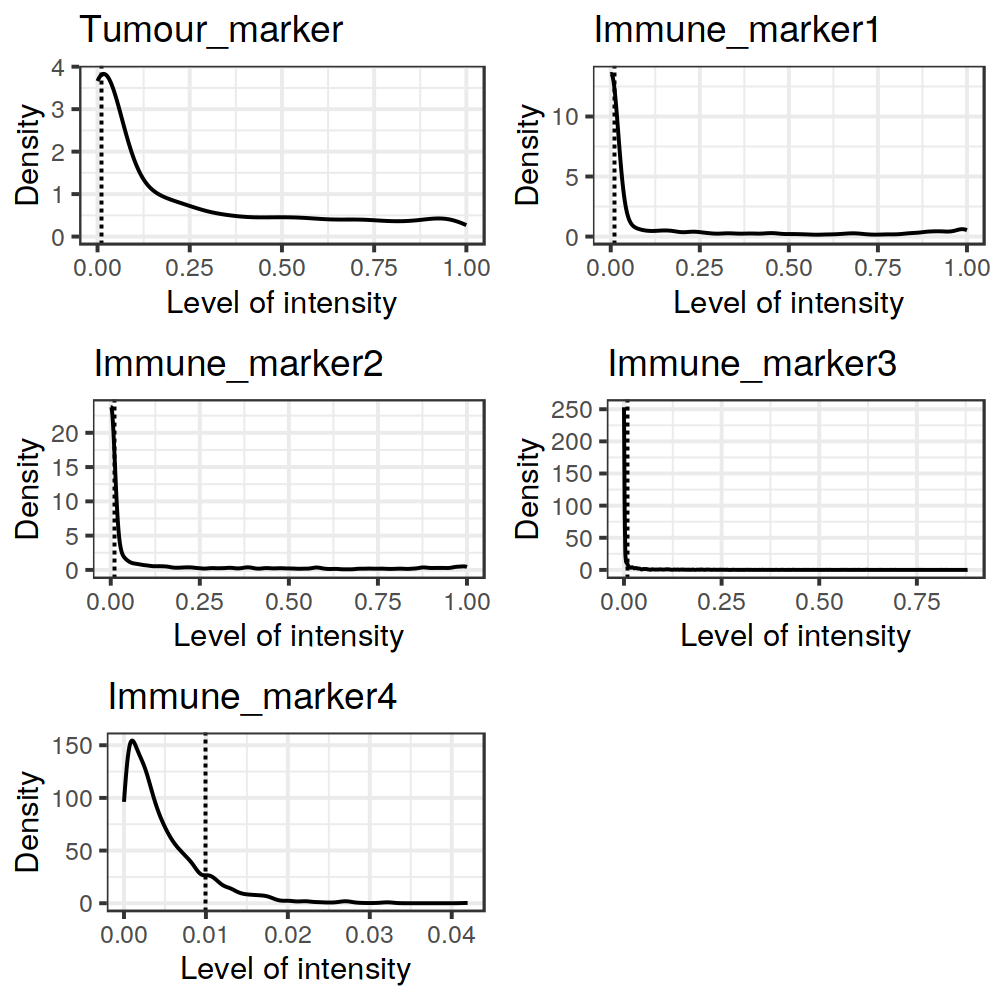

In [26]:
# First predict the phenotypes (this is for generating not 100% accurate phenotypes)
fig(width = 5, height = 5, res = 200)
predicted_image2 <- predict_phenotypes(spe_object = simulated_image, thresholds = NULL, 
                                       tumour_marker = "Tumour_marker", 
                                       baseline_markers = c("Immune_marker1", "Immune_marker2", 
                                                            "Immune_marker3", "Immune_marker4"), 
                                       reference_phenotypes = FALSE)

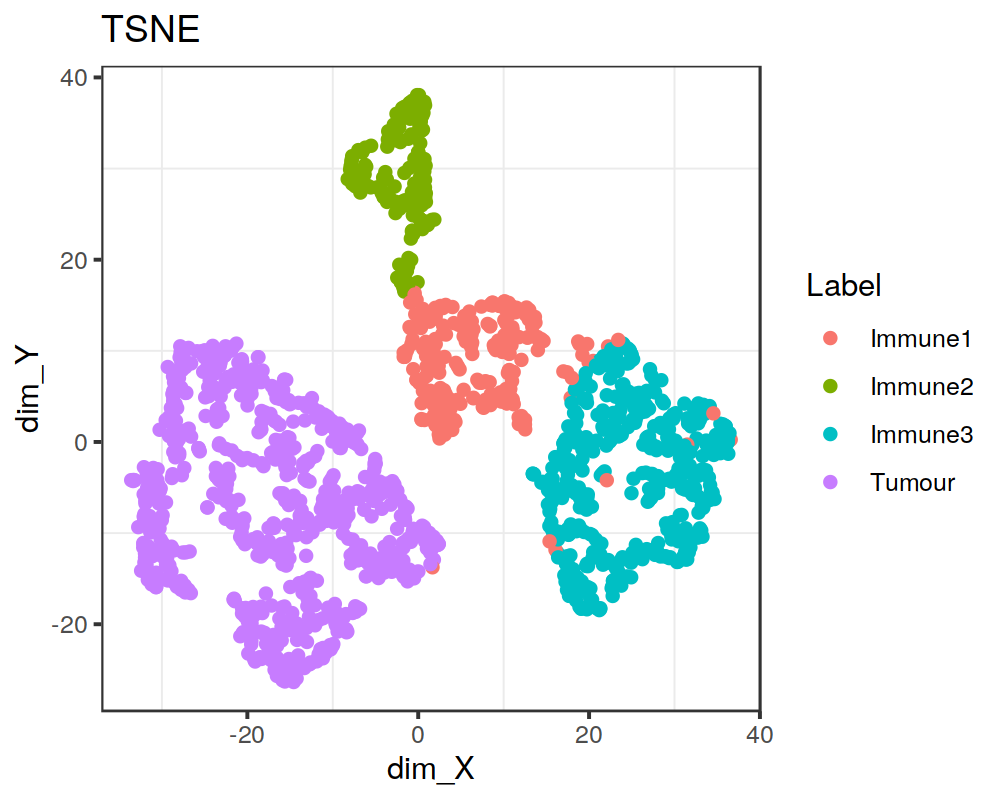

In [27]:
# Then define the cell types based on predicted phenotypes
predicted_image2 <- define_celltypes(predicted_image2, 
                                     categories = c("Tumour_marker", "Immune_marker1,Immune_marker2", 
                                                    "Immune_marker1,Immune_marker3", 
                                                    "Immune_marker1,Immune_marker2,Immune_marker4"), 
                                     category_colname = "Phenotype", 
                                     names = c("Tumour", "Immune1", "Immune2",  "Immune3"), 
                                     new_colname = "Cell.Type")

# Delete cells with unrealistic marker combinations from the dataset
predicted_image2 <- select_celltypes(predicted_image2, "Undefined", feature_colname = "Cell.Type", keep = FALSE)

# TSNE plot
fig(width = 5, height = 4, res = 200)
dimensionality_reduction_plot(predicted_image2, plot_type = "TSNE", feature_colname = "Cell.Type")

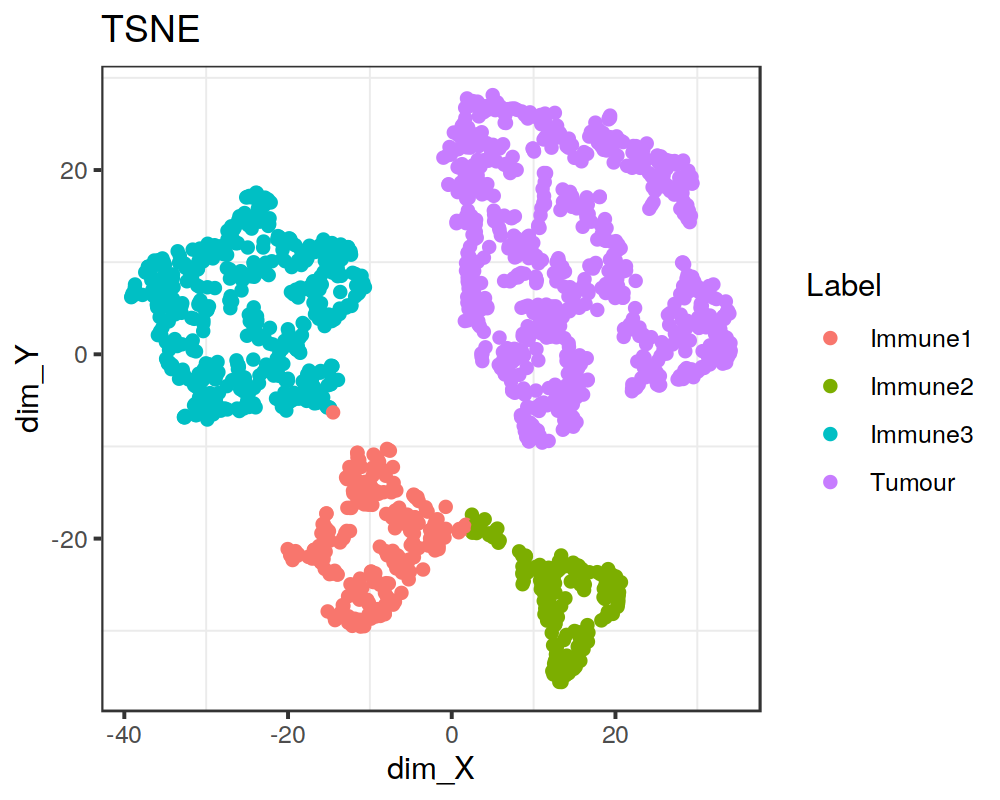

In [28]:
predicted_image2 <- select_celltypes(predicted_image2, c("Cell_3302", "Cell_4917", "Cell_2297", "Cell_488", 
                                                         "Cell_4362", "Cell_4801", "Cell_2220", "Cell_3431", 
                                                         "Cell_533", "Cell_4925", "Cell_4719", "Cell_469", 
                                                         "Cell_1929", "Cell_310", "Cell_2536", "Cell_321", 
                                                         "Cell_4195"), feature_colname = "Cell.ID", keep = FALSE)

fig(width = 5, height = 4, res = 200)
dimensionality_reduction_plot(predicted_image2, plot_type = "TSNE", feature_colname = "Cell.Type")

## 2-3. Visualising tissues

### Categorical dot plot

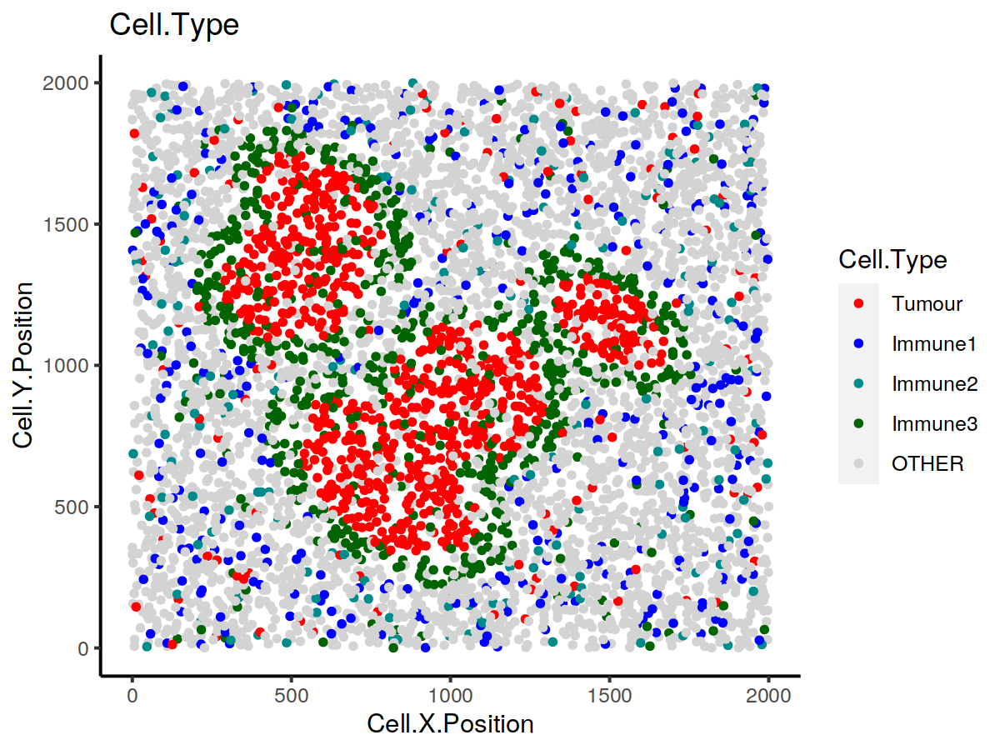

In [29]:
my_colors <- c("red", "blue", "darkcyan", "darkgreen")
  
fig(width = 6, height = 4.5, res = 200)
plot_cell_categories(spe_object = formatted_image, 
                     categories_of_interest = c("Tumour", "Immune1", "Immune2", "Immune3"), 
                     colour_vector = my_colors, feature_colname = "Cell.Type")

### 3D surface plot

In [30]:
marker_surface_plot(formatted_image, num_splits = 15, marker = "Immune_marker1")

HTML widgets cannot be represented in plain text (need html)

### 3D stacked surface plot

In [31]:
marker_surface_plot_stack(formatted_image, num_splits = 15, markers = c("Tumour_marker", "Immune_marker1"))

HTML widgets cannot be represented in plain text (need html)

# 3. Basic analyses with SPIAT


## 3-1. Cell percentages

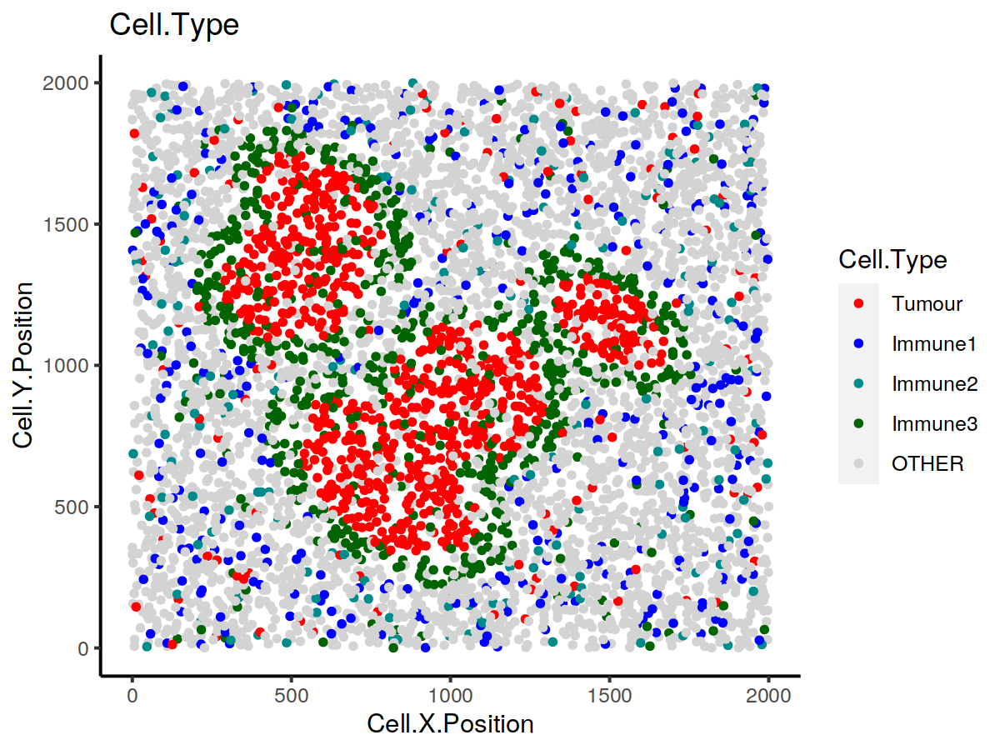

In [32]:
fig(width = 6, height = 4.5, res = 200)
plot_cell_categories(spe_object = formatted_image, 
                     categories_of_interest = c("Tumour", "Immune1", "Immune2", "Immune3"), 
                     colour_vector = my_colors, feature_colname = "Cell.Type")

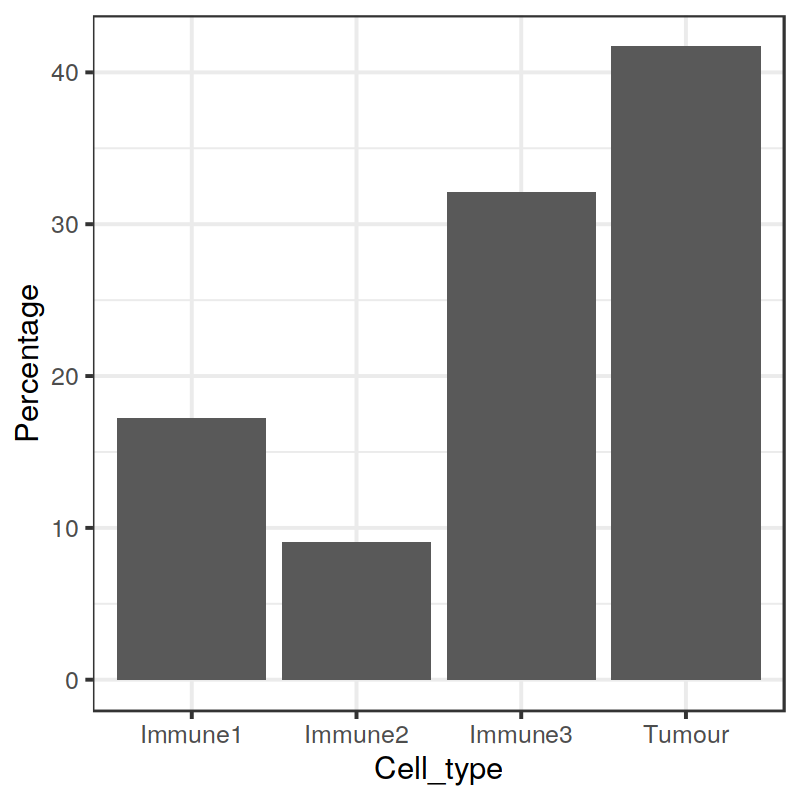

In [33]:
fig(width = 4, height = 4, res = 200)
p_cells <- calculate_cell_proportions(formatted_image, reference_celltypes = NULL, feature_colname ="Cell.Type", 
                                      celltypes_to_exclude = "Others", plot.image = TRUE)

In [34]:
p_cells

,Cell_type,Number_of_celltype,Proportion,Percentage,Proportion_name
,<fct>,<int>,<dbl>,<dbl>,<chr>
5,Tumour,819,0.41679389,41.679389,/Total
3,Immune3,630,0.32061069,32.061069,/Total
1,Immune1,338,0.17201018,17.201018,/Total
2,Immune2,178,0.09058524,9.058524,/Total


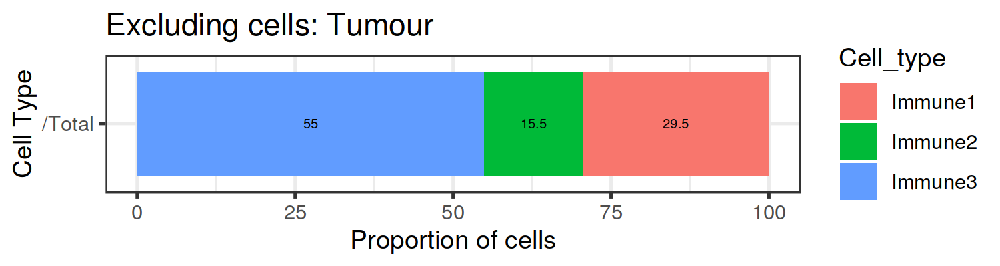

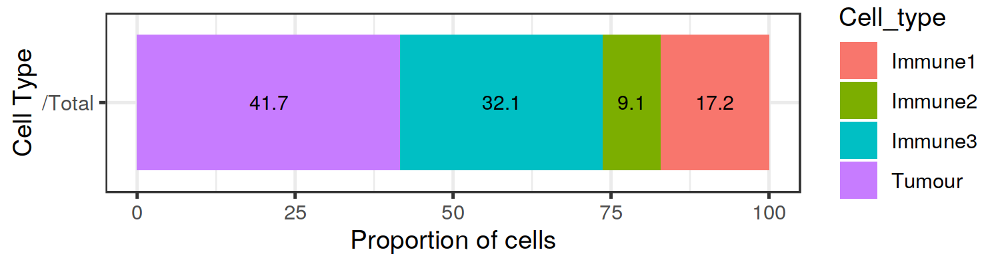

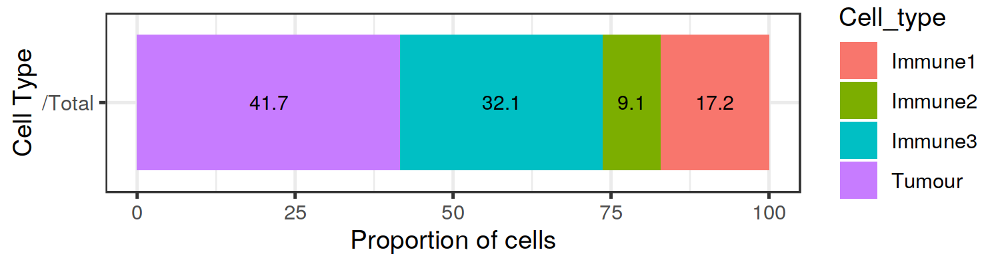

In [35]:
fig(width = 6, height = 1.6, res = 250)
plot_cell_percentages(cell_proportions = p_cells, cells_to_exclude = "Tumour", cellprop_colname = "Proportion_name")

## 3-2. Cell distances

### Pairwise cell distances

In [36]:
distances <- calculate_pairwise_distances_between_celltypes(
    spe_object = formatted_image, 
    cell_types_of_interest = c("Tumour", "Immune1", "Immune3"), 
    feature_colname = "Cell.Type")

head(distances)

,Cell1,Cell2,Distance,Type1,Type2,Pair
,<fct>,<fct>,<dbl>,<chr>,<chr>,<chr>
2,Cell_25,Cell_15,119.39827,Immune1,Immune1,Immune1/Immune1
3,Cell_30,Cell_15,61.77859,Immune1,Immune1,Immune1/Immune1
4,Cell_48,Cell_15,279.84944,Immune1,Immune1,Immune1/Immune1
5,Cell_56,Cell_15,237.67335,Immune1,Immune1,Immune1/Immune1
6,Cell_61,Cell_15,335.22489,Immune1,Immune1,Immune1/Immune1
7,Cell_71,Cell_15,342.60619,Immune1,Immune1,Immune1/Immune1


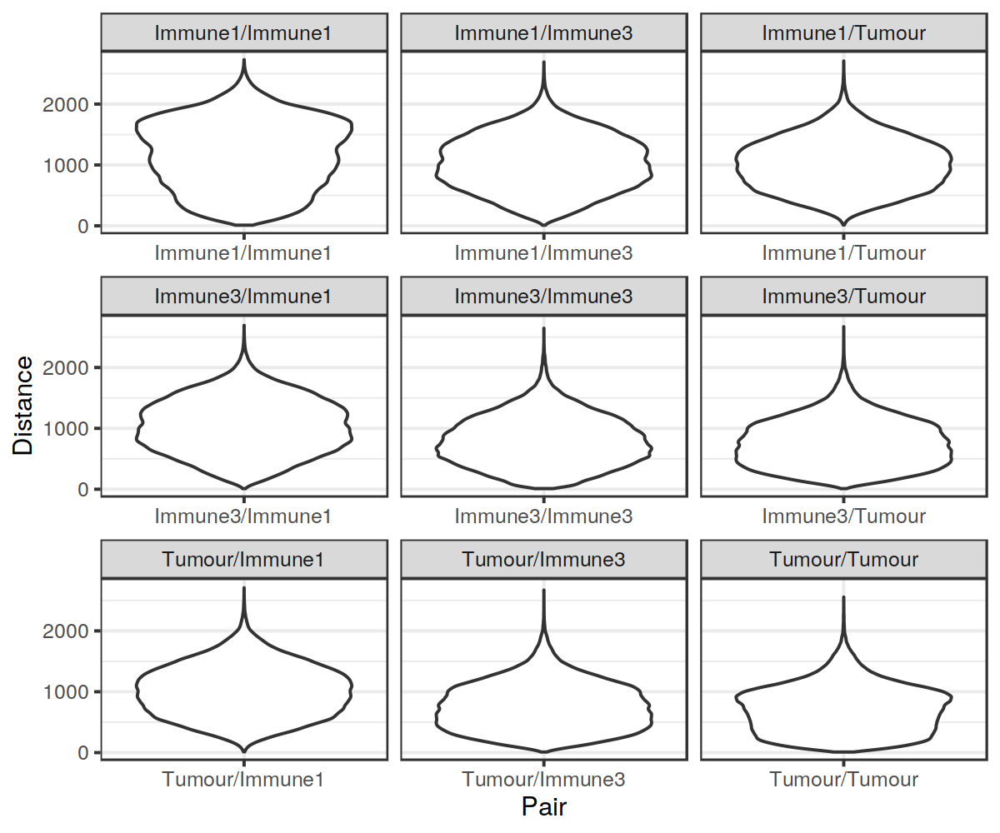

In [37]:
fig(width = 6, height = 5, res = 200)
plot_cell_distances_violin(distances)

In [38]:
summary_distances <- calculate_summary_distances_between_celltypes(distances)
summary_distances

Pair,Mean,Min,Max,Median,Std.Dev,Reference,Target
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Immune1/Immune1,1164.7096,10.84056,2729.120,1191.3645,552.0154,Immune1,Immune1
Immune1/Immune3,1034.4960,10.23688,2691.514,1026.4414,442.2515,Immune1,Immune3
Immune1/Tumour,1013.3697,13.59204,2708.343,1004.6579,413.7815,Immune1,Tumour
Immune3/Immune1,1034.4960,10.23688,2691.514,1026.4414,442.2515,Immune3,Immune1
Immune3/Immune3,794.7765,10.17353,2645.302,769.9948,397.8863,Immune3,Immune3
Immune3/Tumour,758.2732,10.02387,2670.861,733.4501,380.7703,Immune3,Tumour
Tumour/Immune1,1013.3697,13.59204,2708.343,1004.6579,413.7815,Tumour,Immune1
Tumour/Immune3,758.2732,10.02387,2670.861,733.4501,380.7703,Tumour,Immune3
Tumour/Tumour,711.2657,10.00348,2556.332,703.9096,380.3293,Tumour,Tumour


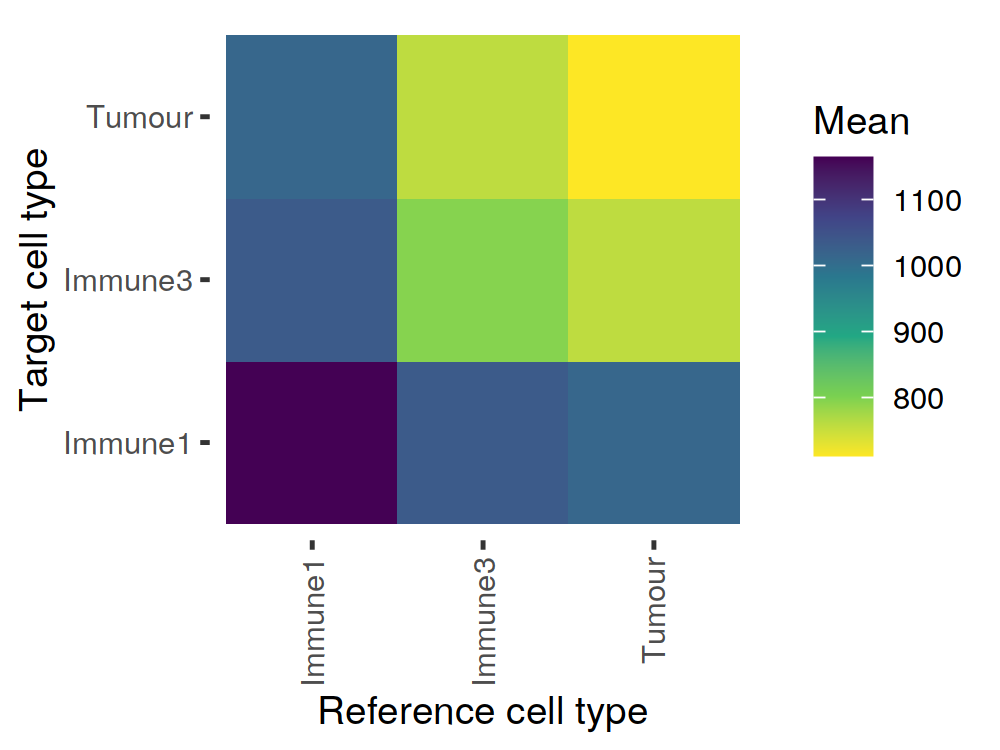

In [39]:
fig(width = 4, height = 3, res = 250)
plot_distance_heatmap(phenotype_distances_result = summary_distances, metric = "mean")

### Minimum cell distances

In [40]:
min_dist <- calculate_minimum_distances_between_celltypes(
    spe_object = formatted_image, 
    cell_types_of_interest = c("Tumour", "Immune1", "Immune2","Immune3", "Others"), 
    feature_colname = "Cell.Type")

head(min_dist)

[1] "Markers had been selected in minimum distance calculation: "
[1] "Others"  "Immune1" "Tumour"  "Immune3" "Immune2"


,RefCell,RefType,NearestCell,NearestType,Distance,Pair
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
2,Cell_1,Others,Cell_25,Immune1,43.71654,Others/Immune1
3,Cell_2,Others,Cell_30,Immune1,36.55302,Others/Immune1
4,Cell_3,Others,Cell_15,Immune1,25.31203,Others/Immune1
5,Cell_4,Others,Cell_15,Immune1,11.48572,Others/Immune1
6,Cell_5,Others,Cell_25,Immune1,46.02692,Others/Immune1
7,Cell_6,Others,Cell_56,Immune1,89.81042,Others/Immune1


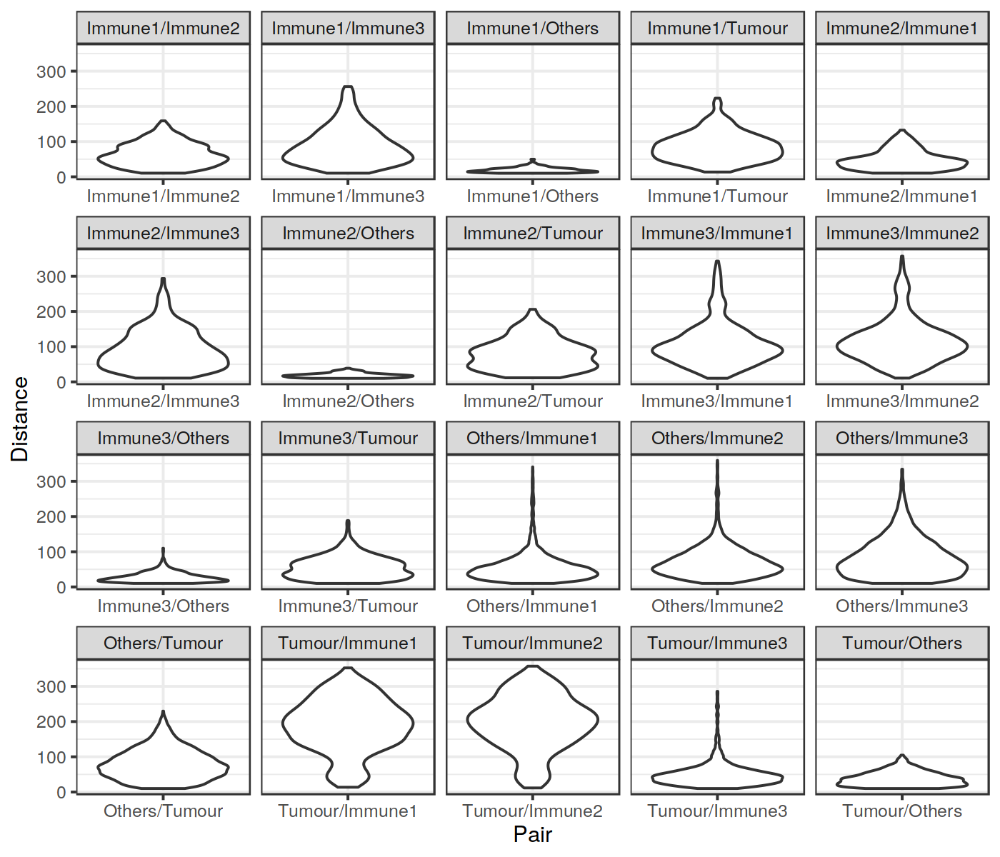

In [41]:
fig(width = 7, height = 6, res = 200)
plot_cell_distances_violin(cell_to_cell_dist = min_dist)

In [42]:
min_summary_dist <- calculate_summary_distances_between_celltypes(min_dist)
head(min_summary_dist)

,Pair,Mean,Min,Max,Median,Std.Dev,Reference,Target
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,Immune1/Immune2,63.65211,10.33652,158.80504,59.01846,32.58482,Immune1,Immune2
2,Immune1/Immune3,88.46152,10.23688,256.30328,77.21765,53.73164,Immune1,Immune3
3,Immune1/Others,19.24038,10.05203,49.86409,17.49196,7.19293,Immune1,Others
4,Immune1/Tumour,85.84773,13.59204,223.15809,80.80592,40.72454,Immune1,Tumour
5,Immune2/Immune1,48.45885,10.33652,132.31086,43.71936,27.43245,Immune2,Immune1
6,Immune2/Immune3,91.58174,10.72629,293.43664,79.11299,56.11624,Immune2,Immune3


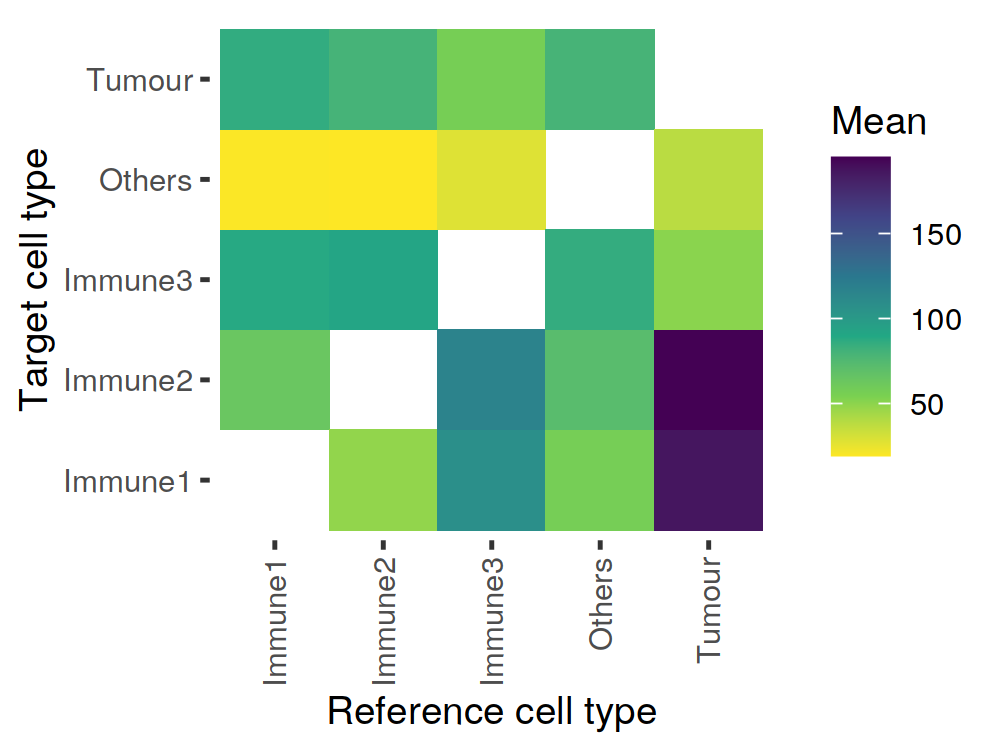

In [43]:
fig(width = 4, height = 3, res = 250)
plot_distance_heatmap(phenotype_distances_result = min_summary_dist, metric = "mean")

# 4. Quantifying cell colocalisation with SPIAT

## 4-1. Cells In Neighbourhood (CIN)

In [44]:
average_percentage_of_cells_within_radius(spe_object = formatted_image, reference_celltype = "Immune1", 
                                          target_celltype = "Immune2", radius = 100, feature_colname = "Cell.Type")

[1] 4.768123

In [45]:
average_marker_intensity_within_radius(spe_object = formatted_image, reference_marker = "Immune_marker3", 
                                       target_marker = "Immune_marker2", radius=30)

[1] 0.5995357

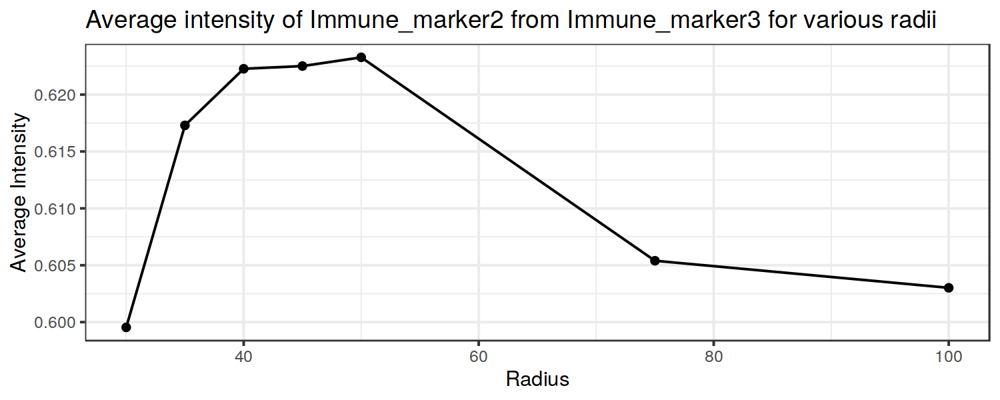

In [46]:
fig(width = 7.5, height = 3, res = 200)
plot_average_intensity(spe_object = formatted_image, reference_marker = "Immune_marker3", 
                       target_marker = "Immune_marker2", radii = c(30, 35, 40, 45, 50, 75, 100))

## 4-2. Mixing Score (MS) and Normalised Mixing Score (NMS)

In [47]:
mixing_score_summary(spe_object = formatted_image, reference_celltype = "Immune1", 
                     target_celltype = "Immune2", radius = 100, feature_colname = "Cell.Type")

,Reference,Target,Number_of_reference_cells,Number_of_target_cells,Reference_target_interaction,Reference_reference_interaction,Mixing_score,Normalised_mixing_score
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,Immune1,Immune2,338,178,583,1184,0.4923986,1.864476


## 4-3. Cross K function

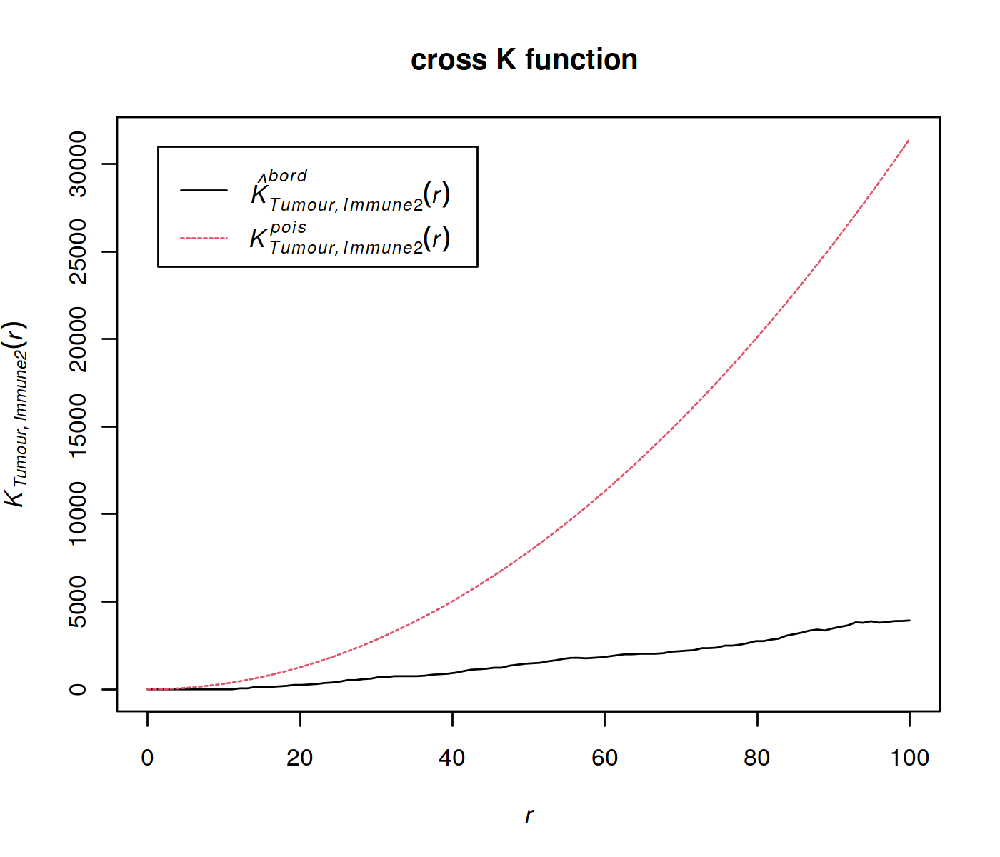

In [48]:
fig(width = 7, height = 6, res = 200)
df_cross <- calculate_cross_functions(formatted_image, method = "Kcross", 
                                      cell_types_of_interest = c("Tumour","Immune2"), 
                                      feature_colname = "Cell.Type", dist = 100)

In [49]:
AUC_of_cross_function(df_cross)

[1] -0.2836735

## 4-4. Cross-K Intersection (CKI)

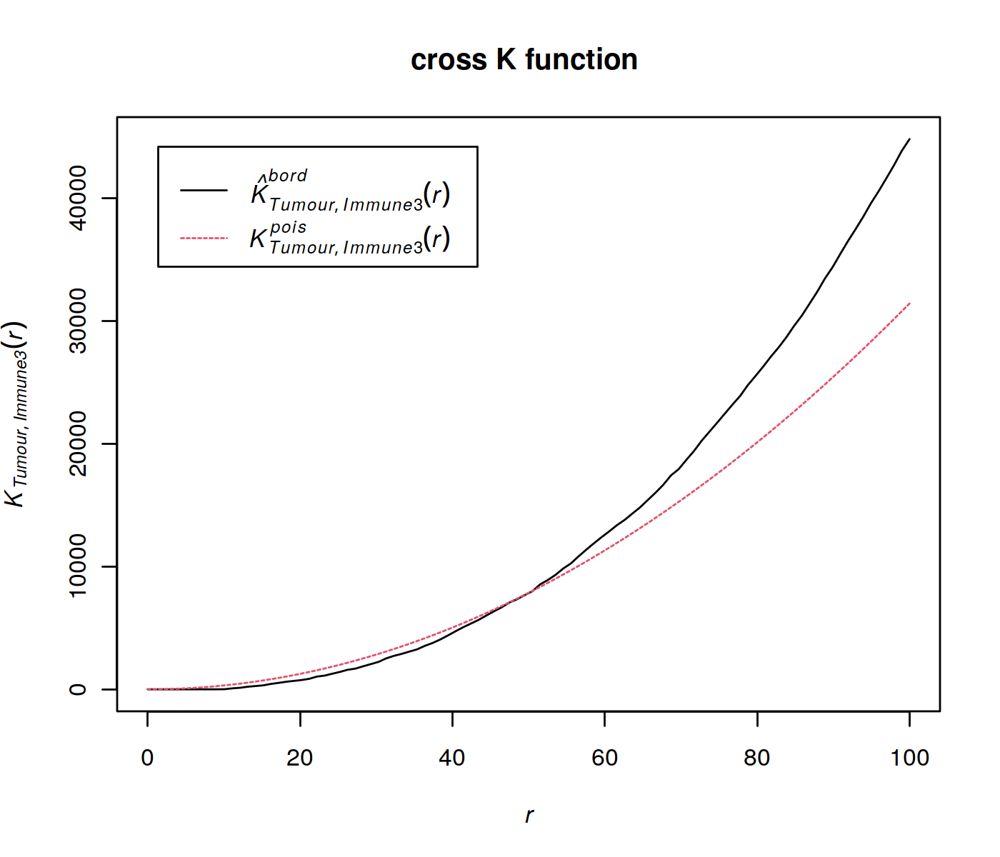

In [50]:
fig(width = 7, height = 6, res = 200)
df_cross <- calculate_cross_functions(formatted_image, method = "Kcross", 
                                      cell_types_of_interest = c("Tumour","Immune3"), 
                                      feature_colname = "Cell.Type", dist = 100)

# 5. Spatial heterogeneity with SPIAT

## 5-1. Localised Entropy

In [51]:
calculate_entropy(formatted_image, cell_types_of_interest = c("Immune1","Immune2"), feature_colname = "Cell.Type")

[1] 0.9294873

### Fishnet grid

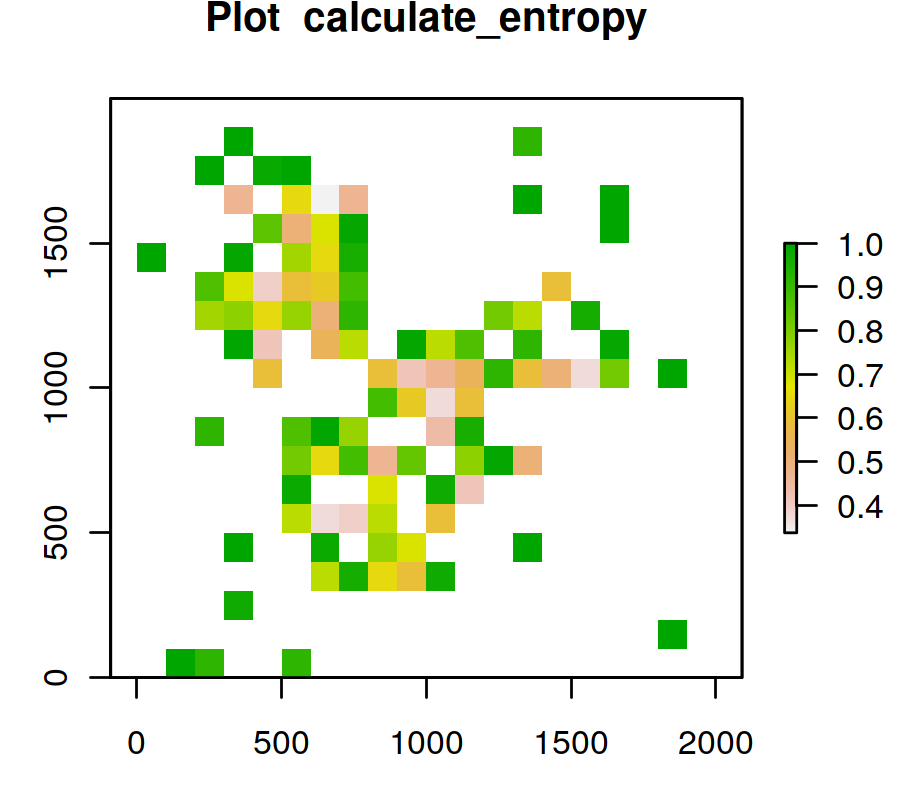

In [52]:
fig(width = 4.5, height = 4, res = 200)
grid <- grid_metrics(defined_image, FUN = calculate_entropy, n_split = 20, 
                     cell_types_of_interest = c("Tumour","Immune3"), feature_colname = "Cell.Type")

In [53]:
calculate_percentage_of_grids(grid, threshold = 0.75, above = TRUE)

calculate_spatial_autocorrelation(grid, metric = "globalmoran")

[1] 13

[1] 0.09446964

## 5-2. Gradients (based on concentric circles)

In [54]:
gradient_positions <- c(30, 50, 100)
gradient_entropy <- compute_gradient(defined_image, radii = gradient_positions, 
                                     FUN = calculate_entropy,  cell_types_of_interest = c("Immune1","Immune2"), 
                                     feature_colname = "Cell.Type")
length(gradient_entropy)

[1] 3

In [55]:
head(gradient_entropy[[1]])

,Cell.X.Position,Cell.Y.Position,Immune1,Immune2,total,Immune1_log2,Immune2_log2,total_log2,Immune1ratio,Immune1_entropy,Immune2ratio,Immune2_entropy,entropy
,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cell_15,109.67027,17.12956,1,0,1,0,0,0,1,0,0,0,0
Cell_25,153.22795,128.29915,1,0,1,0,0,0,1,0,0,0,0
Cell_30,57.29037,49.88533,1,0,1,0,0,0,1,0,0,0,0
Cell_48,83.47798,295.75058,2,0,2,1,0,1,1,0,0,0,0
Cell_56,35.24227,242.84862,1,0,1,0,0,0,1,0,0,0,0
Cell_61,156.39943,349.08154,2,0,2,1,0,1,1,0,0,0,0


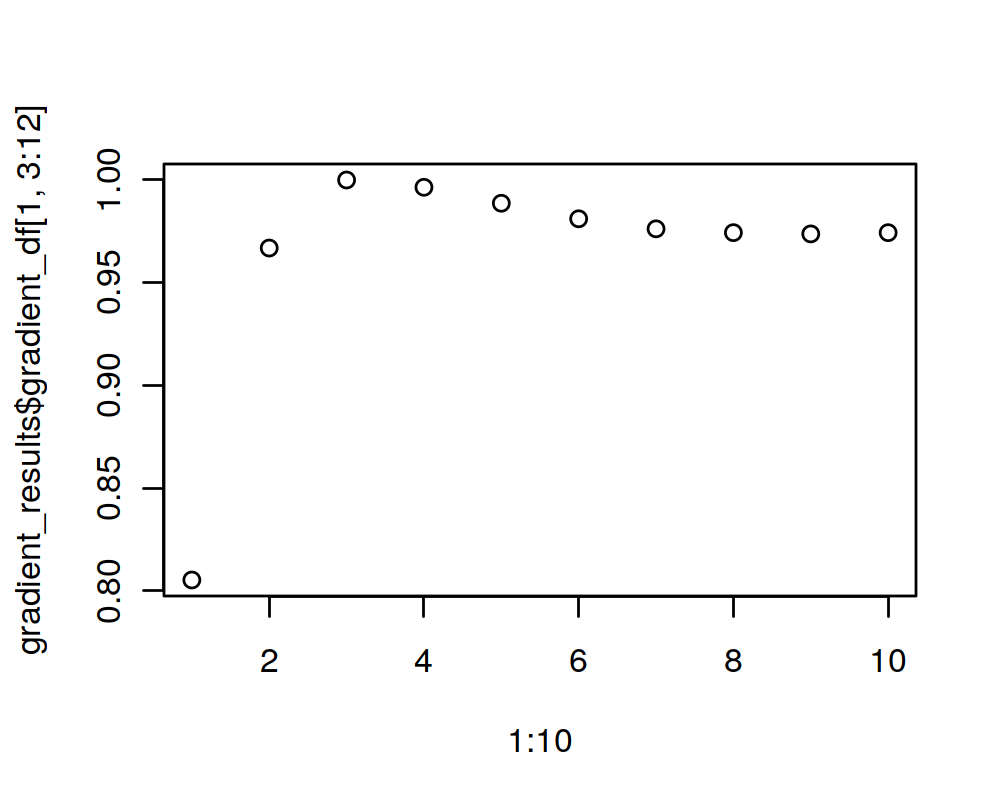

In [56]:
gradient_pos <- seq(50, 500, 50) ##radii
gradient_results <- entropy_gradient_aggregated(defined_image, cell_types_of_interest = c("Immune3","Tumour"),
                                                feature_colname = "Cell.Type", radii = gradient_pos)
# plot the results
fig(width = 5, height = 4, res = 200)
plot(1:10, gradient_results$gradient_df[1, 3:12])

# 6. Characterising tissue structure with SPIAT

## 6-1. Characterising the distribution of the cells of interest in identified tissue regions

### Determining whether there is a clear tumour margin

[1] 0.2014652

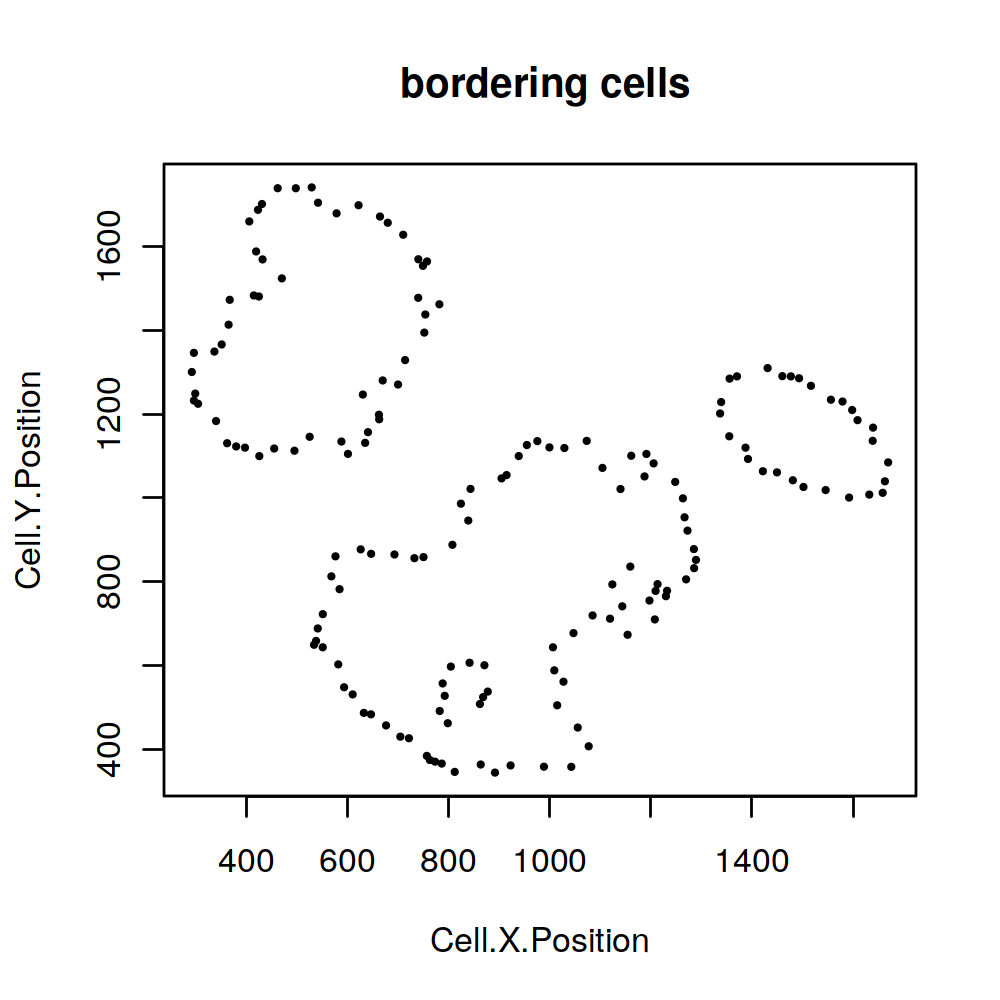

In [57]:
fig(width = 5, height = 5, res = 200)
R_BC(formatted_image, cell_type_of_interest = "Tumour", "Cell.Type")

### Automatic identification of the tumour margin

[1] "The alpha of Polygon is: 63.24375"


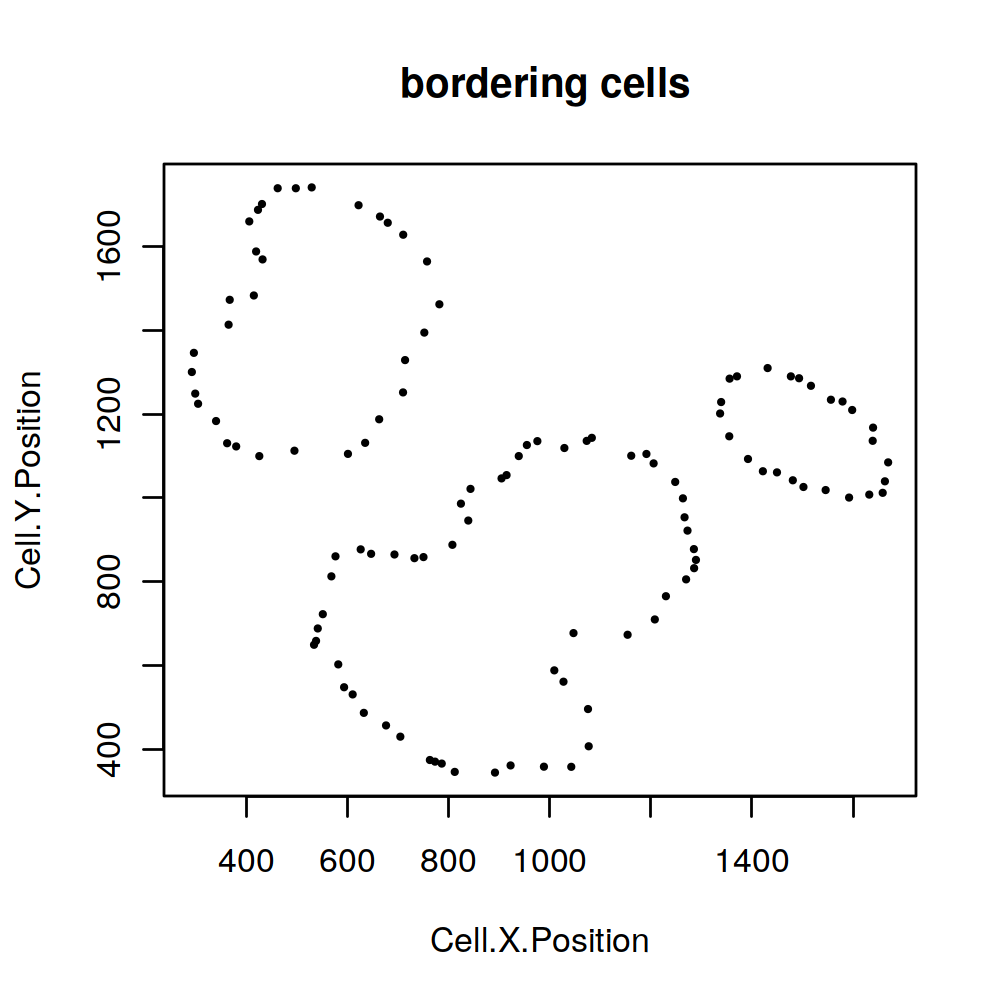

In [58]:
fig(width = 5, height = 5, res = 200)
formatted_border <- identify_bordering_cells(formatted_image, reference_cell = "Tumour", 
                                             feature_colname = "Cell.Type")

In [59]:
# Get the number of tumour clusters
attr(formatted_border, "n_of_clusters")

[1] 3

### Classification of cells based on their locations relative to the margin

In [60]:
formatted_distance <- calculate_distance_to_margin(formatted_border)

[1] "Markers had been selected in minimum distance calculation: "
[1] "Non-border" "Border"    


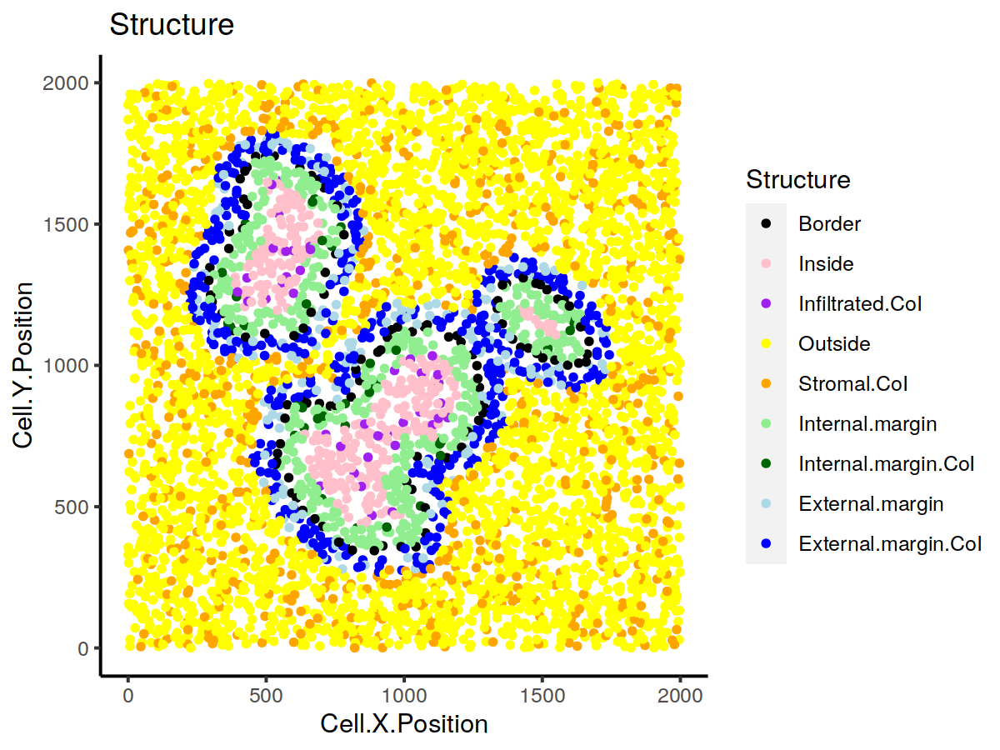

In [61]:
names_of_immune_cells <- c("Immune1", "Immune2","Immune3")

formatted_structure <- define_structure(formatted_distance, 
                                        cell_types_of_interest = names_of_immune_cells, 
                                        feature_colname = "Cell.Type", n_margin_layers = 5)

categories <- unique(formatted_structure$Structure)

fig(width = 6, height = 4.5, res = 200)
plot_cell_categories(formatted_structure, feature_colname = "Structure")

### Calculate the proportions of immune cells in each of the locations

In [62]:
immune_proportions <- calculate_proportions_of_cells_in_structure(
    spe_object = formatted_structure, 
    cell_types_of_interest = names_of_immune_cells, 
    feature_colname = "Cell.Type")

immune_proportions

Cell.Type,Relative_to,P.Infiltrated.CoI,P.Internal.Margin.CoI,P.External.Margin.CoI,P.Stromal.CoI
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Immune1,All_cells_in_the_structure,0.00000000,0.00000000,0.001733102,0.09658928
Immune2,All_cells_in_the_structure,0.00000000,0.00000000,0.001733102,0.05073087
Immune3,All_cells_in_the_structure,0.12576687,0.08071749,0.681109185,0.04585841
Immune1,All_cells_of_interest_in_the_structure,0.00000000,0.00000000,0.002531646,0.50000000
Immune2,All_cells_of_interest_in_the_structure,0.00000000,0.00000000,0.002531646,0.26261128
Immune3,All_cells_of_interest_in_the_structure,1.00000000,1.00000000,0.994936709,0.23738872
Immune1,The_same_cell_type_in_the_whole_image,0.00000000,0.00000000,0.002958580,0.99704142
Immune2,The_same_cell_type_in_the_whole_image,0.00000000,0.00000000,0.005617978,0.99438202
Immune3,The_same_cell_type_in_the_whole_image,0.06507937,0.05714286,0.623809524,0.25396825


### Calculate summaries of the distances for immune cells in the tumour structure

In [63]:
immune_distances <- calculate_summary_distances_of_cells_to_borders(
    spe_object = formatted_structure, 
    cell_types_of_interest = names_of_immune_cells, 
    feature_colname = "Cell.Type")

immune_distances

Cell.Type,Area,Min_d,Max_d,Mean_d,Median_d,St.dev_d
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
All_cell_types_of_interest,Within_border_area,10.93225,192.4094,86.20042,88.23299,45.27414
All_cell_types_of_interest,Stroma,10.02387,984.0509,218.11106,133.18220,199.87586
Immune1,Within_border_area,NA,NA,NA,NA,NA
Immune1,Stroma,84.20018,970.7749,346.14096,301.01535,187.04247
Immune2,Within_border_area,NA,NA,NA,NA,NA
Immune2,Stroma,79.42753,984.0509,333.26374,284.09062,185.67518
Immune3,Within_border_area,10.93225,192.4094,86.20042,88.23299,45.27414
Immune3,Stroma,10.02387,971.5638,102.79227,68.19218,131.32714


# 7. Identifying cellular neighborhood with SPIAT

## 7-1. Cellular neighborhood

[1] 17.01336

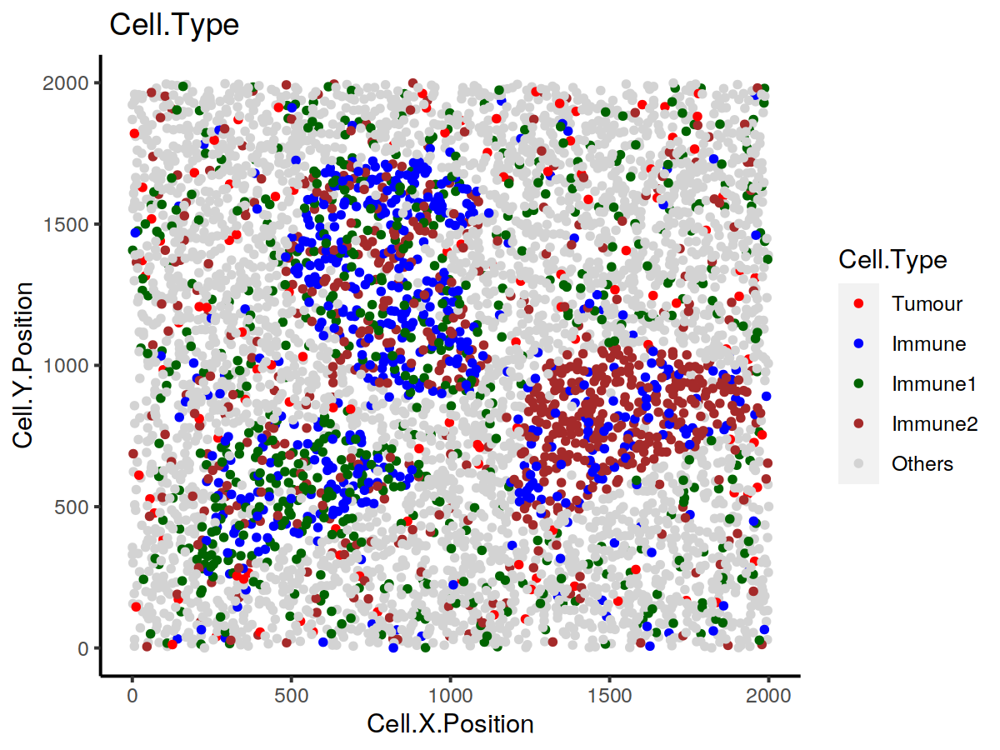

In [64]:
fig(width = 6, height = 4.5, res = 200)
plot_cell_categories(
    image_no_markers, c("Tumour", "Immune","Immune1","Immune2","Others"), 
    c("red","blue","darkgreen", "brown","lightgray"), "Cell.Type")

average_minimum_distance(image_no_markers)

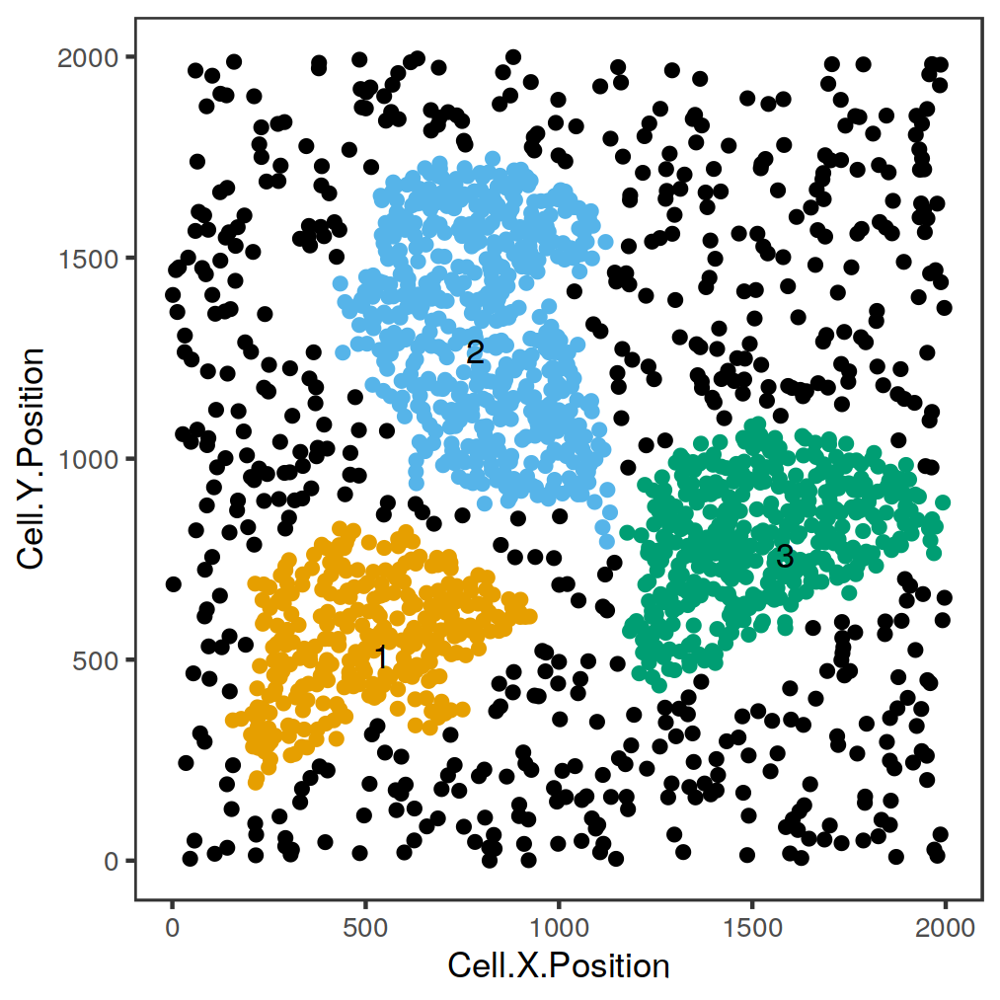

In [65]:
fig(width = 4.5, height = 4.5, res = 225)
clusters <- identify_neighborhoods(
    image_no_markers, method = "hierarchical", min_neighborhood_size = 100, 
    cell_types_of_interest = c("Immune", "Immune1", "Immune2"), radius = 50, feature_colname = "Cell.Type")

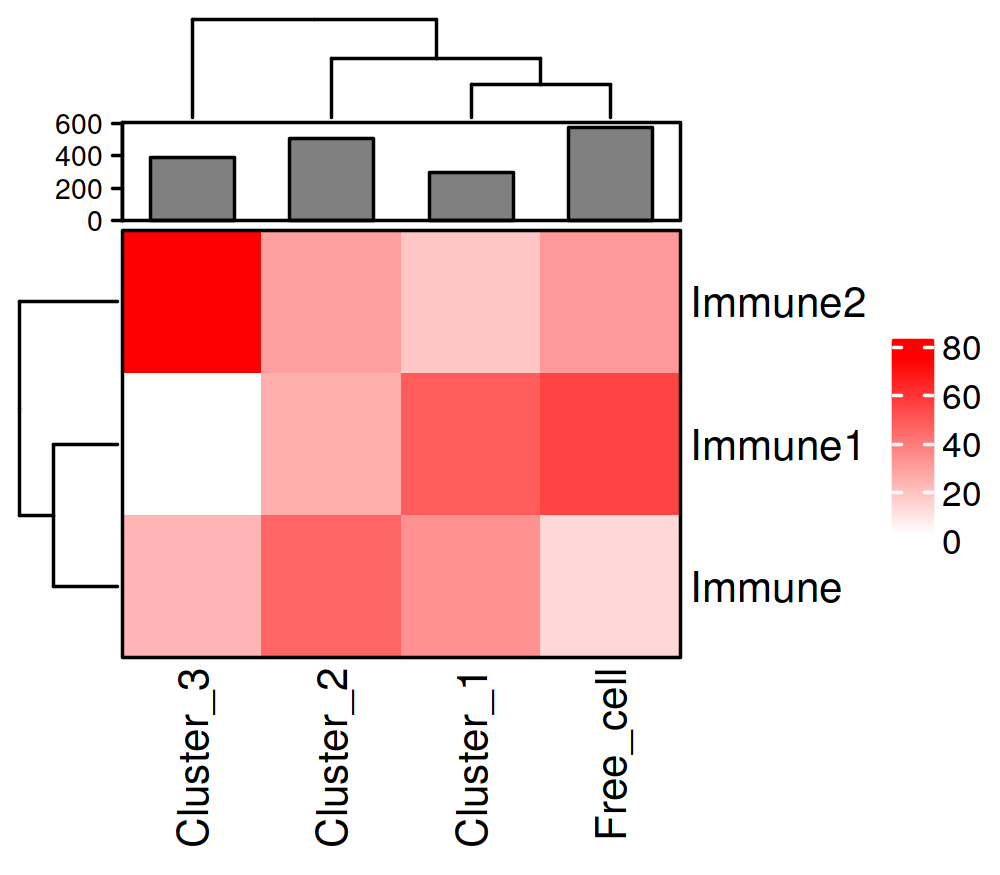

In [66]:
neighorhoods_vis <- composition_of_neighborhoods(clusters, feature_colname = "Cell.Type")
neighorhoods_vis <- neighorhoods_vis[neighorhoods_vis$Total_number_of_cells >= 5,]

fig(width = 4, height = 3.5, res = 250)
plot_composition_heatmap(neighorhoods_vis, feature_colname = "Cell.Type")

## 7-2. Average Nearest Neighbour Index (ANNI)

In [67]:
average_nearest_neighbor_index(clusters, reference_celltypes = c("Cluster_1"), 
                               feature_colname = "Neighborhood", p_val = 0.05)

$ANN_index
[1] 0.4696608

$pattern
[1] "Clustered"

$`p-value`
[1] 2.623132e-68

In [68]:
average_nearest_neighbor_index(image_no_markers, reference_celltypes = c("Immune", "Immune1" , "Immune2"), 
                               feature_colname = "Cell.Type", p_val = 0.05)

$ANN_index
[1] 0.9968575

$pattern
[1] "Random"

$`p-value`
[1] 0.4000806

# Session Info

In [69]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.5 LTS

Matrix products: default
BLAS/LAPACK: /home/ihsuan/miniconda3/envs/SPIAT/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C               LC_TIME=en_GB.UTF-8       
 [4] LC_COLLATE=en_GB.UTF-8     LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                  LC_ADDRESS=C              
[10] LC_TELEPHONE=C             LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] scRUtils_0.1.3              SPIAT_1.0.0                 SpatialExperiment_1.8.0    
 [4] SingleCellExperiment_1.20.0 SummarizedExperiment_1.28.0 Biobase_2.58.0             
 [7] GenomicRanges_1.50.0        GenomeInfoDb_1.34.1         IRanges_2.32.0             
[10] S4Vectors_0.36.0            BiocG